# Πανεπιστήμιο Θεσσαλίας

## Τμήμα Πληροφορικής με Εφαρμογές στη Βιοϊατρική

### Μάθημα:  Υπολογιστική Όραση
### Διδάσκων:  Κ. Δελήμπασης

### Τίτλος: Αναγνώριση Προσώπων - μέθοδος ιδιοπροσώπων

Εκπονήθηκε από τον:  
**Καπετάνιο Δημήτριο  --  (Α.Μ. 01544)**

-(σε συνεργασία με την Βασιλεία Γεωργάκη, 01726)

### Στόχος:

Η διερεύνηση μεθόδων μηχανικής μάθησης για την ανίχνευση προσώπων ενός συγκεκριμένου πλήθους ατόμων. Τα δεδομένα που αξιοποιήθηκαν συνιστούν το δημοφιλές σύνολο εικόνων _Ολιβέτι_. Αυτό αποτελείται από _δέκα_ διαφορετικές λήψεις για κάθε έναν από τους _σαράντα_ συνολικά ανθρώπους, μικτού φύλλου. Το δείγμα, συνεπώς, περιέχει τετρακόσιες διαφορετικές φωτογραφίες.
Ζητείται:

* Η διαίρεση των δεδομένων σε δύο υποσύνολα (_εκμάθησης_, _ελέγχου_) η τομή των οποίων πρέπει να είναι διάφορη του κενού συνόλου. Επίσης, το κάθε υποσύνολο πρέπει να περιλαμβάνει τουλάχιστον μία φωτογραφία από κάθε άνθρωπο.
* Εφαρμογή της μεθόδου των _πρωτευουσών συνιστωσών_ στο υποσύνολο _εκπαίδευσης_ και προκαθορισμός του απαιτούμενου αριθμού ιδιοτιμών.
* Υπολογισμός των προβολών των ιδιοπροσώπων στις νέους άξονες συντεταγμένων.
* Επιλογή των προβολών αυτών ως χαρακτηριστικά για την ταξινόμηση των _άγνωστων_ προσώπων του υποσυνόλου ελέγχου σε μία από τις σαράντα πιθανές κλάσεις ατόμων. Υπάρχει ελευθερία κατά την επιλογή του ταξινομητή. 
* Κατασκευή του αντίστοιχου _πίνακα συνάφειας_.

### Βιβλιοθήκες & Πακέτα

Οι βιβλιοθήκες και τα πακέτα που εφαρμόζονται παρακάτω είναι οι/τα εξείς:

In [1]:
from scipy.io import loadmat
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold, train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report
from IPython.display import display

### Δεδομένα

#### Αρχική κατάσταση

In [2]:
raw_data = loadmat(r'C:\Users\kapet\Desktop\cv\project3\olivetti.mat')

In [3]:
print(raw_data)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Sun Feb  8 17:50:10 2015', '__version__': '1.0', '__globals__': [], 'X': array([[ 75,  83,  83, ...,  42,  40,  38],
       [110, 108, 120, ...,  35,  33,  37],
       [ 77,  75,  65, ...,  37,  38,  37],
       ...,
       [121, 119, 113, ...,  41,  45,  46],
       [ 52,  49,  51, ..., 143, 144, 146],
       [125, 125, 125, ...,  96,  91,  93]], dtype=uint8), 'label': array([[ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 1],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 2],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 4],
       [ 5],
       [ 5],
       [ 5],


#### Προ-επεξεργασία Δεδομένων

In [4]:
# Parsing through this file structure, we could assign all the 'X' values into a new Python list.
faces = [[element for element in upperElement] for upperElement in raw_data['X']]

In [5]:
# jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000
print(faces)         

# (64 x 64) x 400  =  1.638.400

[[75, 83, 83, 74, 81, 76, 75, 64, 60, 64, 69, 71, 71, 79, 79, 76, 76, 79, 91, 138, 148, 148, 151, 152, 142, 140, 145, 149, 155, 163, 151, 140, 156, 156, 160, 182, 189, 94, 46, 44, 42, 45, 43, 42, 42, 45, 42, 44, 44, 44, 46, 45, 43, 42, 47, 47, 46, 47, 48, 50, 50, 52, 49, 49, 89, 98, 101, 99, 102, 95, 91, 88, 84, 76, 76, 80, 85, 87, 96, 110, 123, 133, 144, 142, 145, 147, 150, 152, 152, 152, 150, 150, 148, 147, 149, 150, 149, 150, 152, 154, 155, 107, 40, 20, 32, 45, 47, 45, 47, 42, 44, 43, 44, 42, 41, 43, 43, 45, 46, 49, 49, 50, 49, 48, 49, 50, 51, 50, 101, 106, 109, 114, 115, 115, 129, 135, 142, 144, 145, 143, 143, 141, 144, 146, 151, 153, 156, 156, 157, 161, 162, 161, 161, 159, 159, 160, 161, 160, 158, 158, 156, 157, 153, 152, 153, 150, 151, 131, 75, 42, 30, 37, 41, 41, 43, 45, 44, 45, 44, 44, 43, 44, 46, 47, 49, 48, 46, 47, 48, 54, 51, 49, 107, 114, 124, 127, 141, 148, 158, 158, 154, 152, 149, 147, 150, 149, 148, 150, 155, 159, 164, 166, 167, 170, 170, 168, 168, 168, 169, 168, 168, 16

In [6]:
#
labels = [[element for element in upperElement] for upperElement in raw_data['label']]

In [7]:
print(labels)

[[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [2], [2], [2], [2], [2], [2], [2], [2], [2], [2], [3], [3], [3], [3], [3], [3], [3], [3], [3], [3], [4], [4], [4], [4], [4], [4], [4], [4], [4], [4], [5], [5], [5], [5], [5], [5], [5], [5], [5], [5], [6], [6], [6], [6], [6], [6], [6], [6], [6], [6], [7], [7], [7], [7], [7], [7], [7], [7], [7], [7], [8], [8], [8], [8], [8], [8], [8], [8], [8], [8], [9], [9], [9], [9], [9], [9], [9], [9], [9], [9], [10], [10], [10], [10], [10], [10], [10], [10], [10], [10], [11], [11], [11], [11], [11], [11], [11], [11], [11], [11], [12], [12], [12], [12], [12], [12], [12], [12], [12], [12], [13], [13], [13], [13], [13], [13], [13], [13], [13], [13], [14], [14], [14], [14], [14], [14], [14], [14], [14], [14], [15], [15], [15], [15], [15], [15], [15], [15], [15], [15], [16], [16], [16], [16], [16], [16], [16], [16], [16], [16], [17], [17], [17], [17], [17], [17], [17], [17], [17], [17], [18], [18], [18], [18], [18], [18], [18], [18], [18], [18], [19], [19

In [8]:
print(f'\n The dataset contains;     {len(faces)}  faces/images of size:  (64 x 64)pixels    and     {len(labels)}   corresponding labels.')


 The dataset contains;     400  faces/images of size:  (64 x 64)pixels    and     400   corresponding labels.


In [9]:
# Assume that the images are stored in a list called 'faces'  with shape (400, 4096).

# Transpose 'faces' to have 4096 rows and 400 columns.
image_vector = [list(x) for x in zip(*faces)]

# Create a list of column names (Image numbers/indexes).
image_number = [str(i+1) for i in range(400)]

In [10]:
df = pd.DataFrame(image_vector, columns=image_number)
display(df)

,1,2,3,4,5,6,7,8,9,10,...,391,392,393,394,395,396,397,398,399,400
0,75,110,77,48,121,133,80,31,59,92,...,132,81,110,125,70,97,89,121,52,125
1,83,108,75,53,116,133,78,32,53,94,...,132,81,109,124,71,102,88,119,49,125
2,83,120,65,58,119,138,79,32,60,89,...,132,80,109,114,70,104,88,113,51,125
3,74,127,53,55,119,141,84,31,59,93,...,134,75,107,112,65,95,89,114,55,120
4,81,130,49,57,120,138,86,33,55,108,...,134,71,109,115,65,93,88,118,61,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4091,39,37,37,177,48,166,40,48,44,44,...,40,93,94,84,83,37,103,42,136,91
4092,41,39,37,177,44,170,38,44,47,46,...,38,94,95,83,82,44,116,42,141,93
4093,42,35,37,178,47,171,39,43,47,43,...,44,93,93,76,86,44,123,41,143,96
4094,40,33,38,180,40,171,38,45,47,39,...,46,93,96,86,89,40,129,45,144,91


#### Απεικόνιση των φωτογραφιών

In [11]:
# Convert the dataframe to a NumPy array.
data = df.to_numpy()

In [12]:
# Reshape the data into 400 arrays[64x64], as images.
images = data.reshape(64, 64, 400)
images = np.rot90(images, 3)

In [13]:
# Create a figure with a grid of subplots
fig, axs = plt.subplots(40, 10, figsize=(100, 300))
fig.tight_layout()

# Iterate over the images and plot them
for i, ax in enumerate(axs.flat):
    ax.imshow(images[:, :, i])
    ax.axis('off')

plt.show()

In [14]:
# Transpose the dataframe
df_transposed = df.transpose()

#### Διαχωρισμός σε υποσύνολα

In [15]:
# Split the data into a training set and a testing set
# The training set will include 75% of the data, while the testing set will include the remaining 25%
# Create a StratifiedShuffleSplit object with 40 strata.
shufflesplit = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)


In [16]:
# Convert the labels list back to an array.
labels = np.array(labels)

In [17]:
print(" \t\t Shuffle Split:")
for train_index, test_index in shufflesplit.split(df_transposed, labels):
    X_train = df_transposed.iloc[train_index]
    X_test = df_transposed.iloc[test_index]
    y_train = labels[train_index]
    y_test = labels[test_index]
    print("\n TRAIN:", train_index, "\n\n\n TEST:", test_index)

 		 Shuffle Split:

 TRAIN: [ 11 351 396 371 172 208 309 246 361  65  59  69  31 184  70  33 177 275
 171  90  64 167 193 154  93  67 298  86 237 124 398 155 291  44 138 332
 216 360 338 287  26  72 384 181 231   4  32  51  88 324 173 198 288 224
 128   0 296 307 141  46 188 300 209 352  28 277 136 257 282 375 169 117
 147  41 354 135 331 301   3 244  36  29 265 340 105 369  15 395  48  96
 217 261 133 366 326 158 212  57  45 264 336 219 116 220 248 316 359  14
 146  20 183 111 178  99 350 377 249 164 341  47 143  38 159 241 348 365
 213 313 385 386 109 122 262  73 327  76 221 280 125 339  75 200  21 318
 107  34 175 222 379 243 202 227 271 356   1  30 185 129 247 145 197  77
 252 346 139 130 174 290 160 163  92 320  25 284 321 392 289 388 273  17
 281 234   2 187 112 363   7 335 374 372  68 391 254  56 376 323 344  97
 381  53 121 204  84  18  87  80 337 325  61 199 394 358 333 114 308  13
 297 397 279 186 312 192 101 170 311 315 314 108 370  82  10 144 225 232
 194 120   5 239  37 24

In [18]:
print("\n X_train shape is:  ", X_train.shape)
print("\t &")
print(" X_test shape is:  ", X_test.shape)


 X_train shape is:   (300, 4096)
	 &
 X_test shape is:   (100, 4096)


### Υπολογισμός «Μέσου» Προσώπου

In [19]:
# Compute the mean face
mean_face = np.mean(images, axis=2)

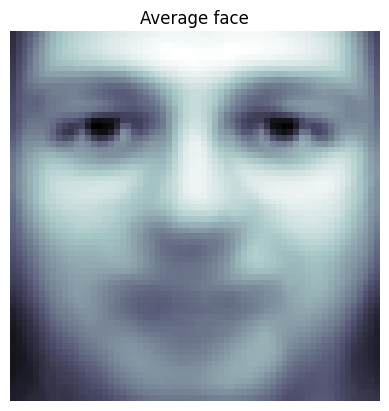

In [20]:
# Plot the mean face
plt.axis('off')
plt.title("Average face")
plt.imshow(mean_face, cmap=plt.cm.bone)

### Ανάλυση Πρωτευουσών Συνιστωσών

#### Σύνθεση ιδιοπροσώπων

Παρακάτω έγινε η επιλογή ενός συνόλου εκατόν-πενήντα ιδιοπροσώπων για την εκπροσώπιση της πληροφορίας των τριακοσίων φωτογραφιών.

In [21]:
pca = PCA(n_components=150, whiten=True)
# Whitening the data in PCA means that each feature is transformed to have a unit variance, 
#  which means that all the features will have the same scale. 
# This can be useful in cases where the features have different scales and one feature might dominate the others in terms of
# variance. Whitening the data can also make the PCA algorithm converge faster. 
#  Whitening is achieved by dividing each feature by the standard deviation of all the features.
pca.fit(X_train)

PCA(n_components=150, whiten=True)

In [22]:
print("\n Principal Components' shape is:  ", pca.components_.shape)


 Principal Components' shape is:   (150, 4096)


In [23]:
print(pca.components_)

[[-0.00687269 -0.00734966 -0.00807537 ...  0.00267509  0.0045177
   0.00444593]
 [-0.02648129 -0.02774488 -0.02956845 ...  0.02527663  0.02590547
   0.0259583 ]
 [ 0.00226255 -0.00080889 -0.00450524 ... -0.01069087 -0.01094032
  -0.00938566]
 ...
 [ 0.04444607  0.03787724  0.03467792 ... -0.03846459 -0.03453876
  -0.00997422]
 [-0.02816651 -0.03907231 -0.0314523  ... -0.01945287 -0.00463852
  -0.01680784]
 [-0.02630272 -0.04531093 -0.02929926 ... -0.00766574 -0.01246843
  -0.01491079]]


In [24]:
# Sum of all explained variances
total_variance = np.sum(pca.explained_variance_)
print("\n Sum of total variance is:   ", total_variance)


 Sum of total variance is:    4471863.908394067


In [25]:
# Calculate the explained variance percentage for each principal component
explained_variance_percentage = (pca.explained_variance_ / total_variance) * 100

# Print the explained variance percentage
print(f'\n Variance(%) for each of the {len(pca.explained_variance_)} the principal components!  \n')
print(explained_variance_percentage)


 Variance(%) for each of the 150 the principal components!  

[24.86594375 14.21662742  8.2560175   4.968182    3.48396885  3.24550603
  2.54284586  2.1320503   2.06494292  1.80670107  1.57418945  1.45994182
  1.34335519  1.23956809  1.13236973  1.03188457  0.96141453  0.86981035
  0.79285394  0.74206186  0.70202314  0.64347354  0.63620512  0.60425678
  0.588029    0.55989844  0.55087887  0.48612221  0.48112397  0.4644141
  0.41771268  0.4074446   0.39055565  0.36539807  0.34915066  0.34368742
  0.32927314  0.31572324  0.3070865   0.29793401  0.28671521  0.26775681
  0.26436195  0.26000512  0.25382425  0.24318514  0.24134816  0.23742432
  0.23330848  0.22079216  0.21670111  0.21130018  0.20212815  0.2014385
  0.19167698  0.18397181  0.18339383  0.17904458  0.17219215  0.17061256
  0.16701761  0.16373768  0.16064257  0.15882939  0.15648735  0.1505471
  0.14855758  0.14295428  0.14147438  0.13723104  0.13560146  0.13310571
  0.13016329  0.12873432  0.12748877  0.12365595  0.12120644  0.

#### Γράφημα ποσοστιαίας διακύμανσης ανά συνιστώσα

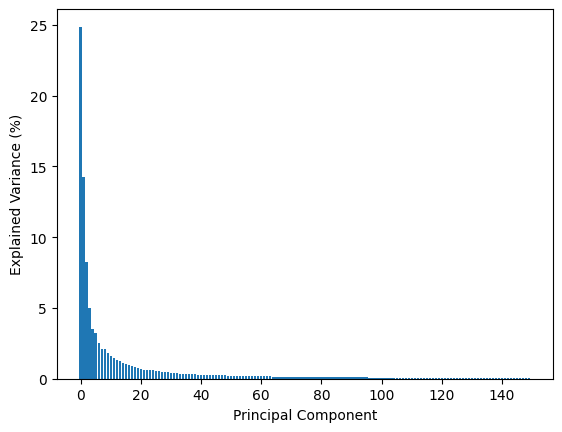

In [26]:
# Plot the explained variance percentage for all principal components.
plt.bar(range(len(explained_variance_percentage)), explained_variance_percentage)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')
plt.show()

#### Συγκρατηθείσα πληροφορία

Η πληροφορία που έγκειται στις πρώτες δύο συνιστώσες.
(Αποτυπώνεται σε ποσοστό επί της συνολικής διακύμανσης)

In [27]:
# Sum of explained variance from the first 2 principal components.
pc2_variance = np.sum(pca.explained_variance_[:2])

print((pc2_variance / total_variance) * 100)

39.08257117421934


Η πληροφορία που έγκειται στις πρώτες τρεις συνιστώσες.
(Αποτυπώνεται σε ποσοστό επί της συνολικής διακύμανσης)

In [28]:
# Sum of explained variance from the first 3 principal components.
pc3_variance = np.sum(pca.explained_variance_[:3])

print((pc3_variance / total_variance) * 100)

47.33858867377912


Η πληροφορία που έγκειται στις πρώτες δέκα συνιστώσες.
(Αποτυπώνεται σε ποσοστό επί της συνολικής διακύμανσης)

In [29]:
# Sum of explained variance from the first 10 principal components.
pc10_variance = np.sum(pca.explained_variance_[:10])

print((pc10_variance / total_variance) * 100)

67.58278569940715


Υπολογισμός του πλήθους των απαιτούμενων πρωτευουσών συνιστωσών για τη συγκράτηση του ενενήντα-πέντε τις εκατό (%) του συνόλου της πληροφορίας.
Το υπόλοιπο πέντε τις εκατό παραβλέπεται και μπορεί να θεωρηθεί ως αμελητέο.
Αποσκοπεί στη μείωση της πολυπλοκότητας του δείγματος και τη διευκόλυνση των μετέπειτα υπολογισμών.

In [30]:
# Initialize a variable to store the cumulative explained variance
cumulative_explained_variance = 0
# Initialize a variable to store the number of components
num_components = 0
# Threshold
threshold = 95.0
# Iterate over the explained variance percentages
for explained_variance in explained_variance_percentage:
    # Add the current explained variance to the cumulative explained variance
    cumulative_explained_variance += explained_variance
    # Increment the number of components
    num_components += 1
    # Check if the cumulative explained variance is greater than or equal to 90%
    if cumulative_explained_variance >= threshold:
        # Print the number of components that retain 90% of the total variance
        print(f'\n Number of components that explain  {threshold} (%) of total variance is -->   {num_components}  \n\n\n')
        break


 Number of components that explain  95.0 (%) of total variance is -->   79  





Προβολή των δεδομένων από τα υποσύνολα _εκμάθησης_ και _ελέγχου_ στους αναθεωρημένους άξονες συντεταγμένων.

In [31]:
# With this projection computed, we can now project our original training and test data onto the PCA basis:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [32]:
print(X_train_pca.shape)

(300, 150)


In [33]:
print(X_test_pca.shape)

(100, 150)


### Εκπαίδευση ταξινομητή

Μετασχηματισμός των ετικετών των δύο υποσυνόλων:   _εκμάθησης_, _ελέγχου_

Σε μονοδιάστατους τανυστές, ώστε να αναγνωριστούν επιτυχώς σαν είσοδοι στον ταξινομητή.
Ως ταξινομητής επιλέχθηκαν οι:  **μηχανές υποστήριξης διανυσμάτων**

In [34]:
# Flatten the labels to 1D.
y_train = y_train.ravel()
y_test = y_test.ravel()

In [35]:
# Doing the Learning: Support Vector Machines.

clf = SVC(C=5., gamma=0.001)
clf.fit(X_train_pca, y_train)

SVC(C=5.0, gamma=0.001)

## Αξιολόγηση απόδοσης ταξινόμησης

### Αναφορά ταξινόμησης

In [36]:
y_pred = clf.predict(X_test_pca)
class_report = classification_report(y_test, y_pred)

In [37]:
print(class_report)

              precision    recall  f1-score   support

           1       0.50      1.00      0.67         2
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         2
           5       1.00      0.67      0.80         3
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         2
           8       1.00      0.67      0.80         3
           9       1.00      1.00      1.00         2
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       1.00      1.00      1.00         3
          13       1.00      0.50      0.67         2
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         2
          16       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         2
          18       1.00    

### Πίνακας Συνάφειας

In [38]:
# np.set_printoptions(threshold = None)
# np.set_printoptions(threshold=np.inf)

In [39]:
confusion_mat = confusion_matrix(y_test, y_pred)
print(f'\n\n The Confusion Matrix (40x40) is: \n')
print(confusion_mat)



 The Confusion Matrix (40x40) is: 

[[2 0 0 ... 0 0 0]
 [0 3 0 ... 0 0 0]
 [0 0 3 ... 0 0 0]
 ...
 [0 0 0 ... 2 0 0]
 [0 0 0 ... 0 3 0]
 [0 0 0 ... 0 0 2]]


In [40]:
print(confusion_matrix(y_pred, y_test))

[[2 0 0 ... 0 0 0]
 [0 3 0 ... 0 0 0]
 [0 0 3 ... 0 0 0]
 ...
 [0 0 0 ... 2 0 0]
 [0 0 0 ... 0 3 0]
 [0 0 0 ... 0 0 2]]


In [41]:
lbl = np.unique(labels)
print(lbl)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]


In [42]:
pd.options.display.max_columns = None
# pd.options.display.max_rows = None

In [43]:
confusion_mat_df = pd.DataFrame(confusion_mat, index=lbl, columns=lbl)
display(confusion_mat_df)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40
1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Βιβλιογραφία

* K. Delimbasis, classroom & e-class notes, University of Thessaly, Lamia.
* M. A. Turk and A. P. Pentland, "Face recognition using eigenfaces," Proceedings. 1991 IEEE Computer Society Conference on Computer Vision and Pattern Recognition, Maui, HI, USA, 1991, pp. 586-591, doi: 10.1109/CVPR.1991.139758.
* https://www.wikiwand.com/en/Eigenface
* https://towardsdatascience.com/eigenfaces-recovering-humans-from-ghosts-17606c328184
* https://www.geeksforgeeks.org/ml-face-recognition-using-eigenfaces-pca-algorithm/
* https://learnopencv.com/eigenface-using-opencv-c-python/
* http://scipy-lectures.org/packages/scikit-learn/auto_examples/plot_eigenfaces.html